In [3]:
import os

try:
  import google.colab
  IN_COLAB = True
except:
  IN_COLAB = False

print("in colab?", IN_COLAB)

if IN_COLAB:
    from google.colab import drive
    drive.mount("/content/drive/")
    os.chdir('/content/drive/MyDrive/Denoise/cxr-experiment')
    !pwd # print current path
    # Install non-standard colab dependencies.
    !pip install torchinfo
    !pip install torchmetrics
    !pip install torchxrayvision
import copy
import torch
import numpy as np
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from PIL import Image, ImageFile
import requests
from io import BytesIO
from IPython.display import display
import matplotlib.pyplot as plt
import torchvision.models as models
import time
from torchvision.io import read_image
from torch.utils.data import Dataset
import time
import datetime
import pickle
import os
import torchxrayvision as xrv
import oxr_utils as oxr

# after !pip install (in case of colab)
from torchmetrics.image import StructuralSimilarityIndexMeasure, PeakSignalNoiseRatio
import torchinfo

from tqdm.autonotebook import tqdm
from torch.utils.data import DataLoader

torch.cuda.empty_cache()

# Select device
device = "str"#torch.device("cpu")
if torch.cuda.is_available():
    device = "cuda"#torch.device("cuda")
    torch.cuda.empty_cache()

print("Device: {}".format(device))

# util functions
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


from oxr_utils import *

in colab? False
Device: cuda


In [4]:

if IN_COLAB:
    # USE THIS BLOCK COPIES THE NIH DATASET TO LOCAL COLAB INSTANCE AND IMPORTS THE NIH DATASET
    import zipfile
    import os
    from google.colab import drive
    drive.mount('/content/drive/')

    NIH_DATA_PATH = "/content/data/NIH_data"
    DRIVE_PATH = "/content/drive/MyDrive/Datasets"
    drive.mount('/content/drive/')

    zip_ref = zipfile.ZipFile(f"{DRIVE_PATH}/NIH_data.zip", 'r')
    if not os.path.exists(NIH_DATA_PATH):
      print("data path does not exist")
      zip_ref.extractall("/content/data") # can take 10-20min, but will make access very fast (30+ imgs/s)
      zip_ref.close()

    # Import NIH_Dataset class
    #NOTEBOOK_PATH = os.getcwd() # copy the dataset class file to the cwd
    #os.system(f"cp {DRIVE_PATH}/nih_dataset.py {NOTEBOOK_PATH}")

else: 
   NIH_DATA_PATH = "../data/NIH_data" # local path to the NIH dataset # Desktop

print("NIH_DATA_PATH: ", NIH_DATA_PATH)

NIH_DATA_PATH:  ../data/NIH_data


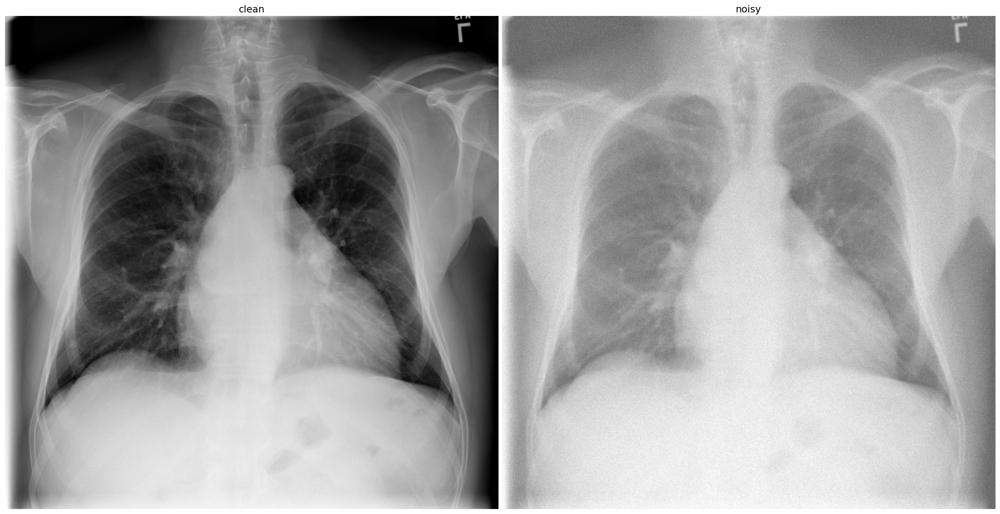

train/val/test: 32/80/80


In [5]:
# ------ Datset Loading ------

DATA_PATH = NIH_DATA_PATH 
# DATA_PATH = "../data/NIH"

nih_train = NIH_Dataset(DATA_PATH, split="train")
nih_val = NIH_Dataset(DATA_PATH, split="val")
nih_test = NIH_Dataset(DATA_PATH, split="test")

LIMIT_DATA = None # For Using Full Dataset
LIMIT_DATA = [32, 80, 80] # For Testing

if LIMIT_DATA:
  nih_train = torch.utils.data.Subset(nih_train, range(LIMIT_DATA[0])) if LIMIT_DATA[0] else nih_train
  nih_val = torch.utils.data.Subset(nih_val, range(LIMIT_DATA[1])) if LIMIT_DATA[1] else nih_val
  nih_test = torch.utils.data.Subset(nih_test, range(LIMIT_DATA[2])) if LIMIT_DATA[2] else nih_test

BATCH_SIZE = 4

train_dl = DataLoader(nih_train, batch_size=BATCH_SIZE, pin_memory=True, num_workers=4)
val_dl = DataLoader(nih_val, batch_size=BATCH_SIZE)
test_dl = DataLoader(nih_test, batch_size=BATCH_SIZE)

NOISE_STRENGTH = 0.4
MIN_SIGNAL = 0.05

#NOISE_MOD = NoiseModule(NOISE_STRENGTH, MIN_SIGNAL).to(device)
NOISE_MOD = CameraApprox(1.0) #CameraDistort()

plot_cxr_images([nih_train[0][0][0], NOISE_MOD(nih_train[0][0])[0]], ["clean", "noisy"], figsize=(20, 40)) # show example
print(f"train/val/test: {len(nih_train)}/{len(nih_val)}/{len(nih_test)}")

In [6]:
# ------ Loss Functions ------
patch_loss = CombinedLoss([ oxr.MSELoss(), oxr.GradientLoss(loss_type="mse")], device=device).to(device)
diagnostic_loss = CombinedLoss([ oxr.MSELoss(), oxr.GradientLoss(loss_type="mse"), oxr.DiagnosisConsistencyLoss(True, device=device) ], device=device).to(device)

# ------ Training Configuration ------

TRAINING_STEPS = [
    dict(patch_size=256, epochs=3, batch_size=32, reset_lr=True, loss_fn=patch_loss),
    dict(patch_size=512, epochs=3,  batch_size=8, reset_lr=False, loss_fn=patch_loss),
    dict(patch_size=1024, epochs=4, batch_size=2, reset_lr=True, loss_fn=diagnostic_loss),
]

# Create one DataLoader per stage
training_step_dataloaders = [
    DataLoader(
        RandomPatchDataset(nih_train, patch_size=step["patch_size"]),
        batch_size=step["batch_size"],
        pin_memory=True,
        num_workers=4,
        prefetch_factor=2,
        drop_last=True
    )
    for step in TRAINING_STEPS
]

# Extract epochs and total epoch count
num_epochs = sum([step["epochs"] for step in TRAINING_STEPS])


In [7]:
# ------ Model Definition ------
model = ResUNet(s=4, k=32).to(device)
torchinfo.summary(model, (BATCH_SIZE,1,1024,1024))

Layer (type:depth-idx)                        Output Shape              Param #
ResUNet                                       [4, 1, 1024, 1024]        --
├─ModuleList: 1-1                             --                        --
│    └─EncoderStep: 2-1                       [4, 32, 512, 512]         --
│    │    └─DoubleConv: 3-1                   [4, 32, 1024, 1024]       9,696
│    │    └─MaxPool2d: 3-2                    [4, 32, 512, 512]         --
│    └─EncoderStep: 2-2                       [4, 64, 256, 256]         --
│    │    └─DoubleConv: 3-3                   [4, 64, 512, 512]         55,680
│    │    └─MaxPool2d: 3-4                    [4, 64, 256, 256]         --
│    └─EncoderStep: 2-3                       [4, 128, 128, 128]        --
│    │    └─DoubleConv: 3-5                   [4, 128, 256, 256]        221,952
│    │    └─MaxPool2d: 3-6                    [4, 128, 128, 128]        --
│    └─EncoderStep: 2-4                       [4, 256, 64, 64]          --
│    │  

In [8]:
# ------ Loss Function and Metrics ------

log_metrics = {
    "loss": None, # will be set during training
    "MSE": nn.MSELoss().to(device),
    "SSIM": StructuralSimilarityIndexMeasure(data_range=1.0).to(device),
    "PSNR": PeakSignalNoiseRatio(data_range=1.0).to(device),
    "L1": nn.L1Loss().to(device),
    "Gradien MSE": GradientLoss(loss_type="mse").to(device),
    "Gradien L1": GradientLoss(loss_type="l1").to(device),
    "Diagnostic Loss": oxr.DiagnosisConsistencyLoss().to(device), # Note, this does not work for patch training!
}


--- Training Step 1/3: patch_size=256, epochs=3, batch_size=32 ---
Resetting optimizer learning rate
Train Epoch 1/10


100%|██████████| 1/1 [00:18<00:00, 18.08s/it]


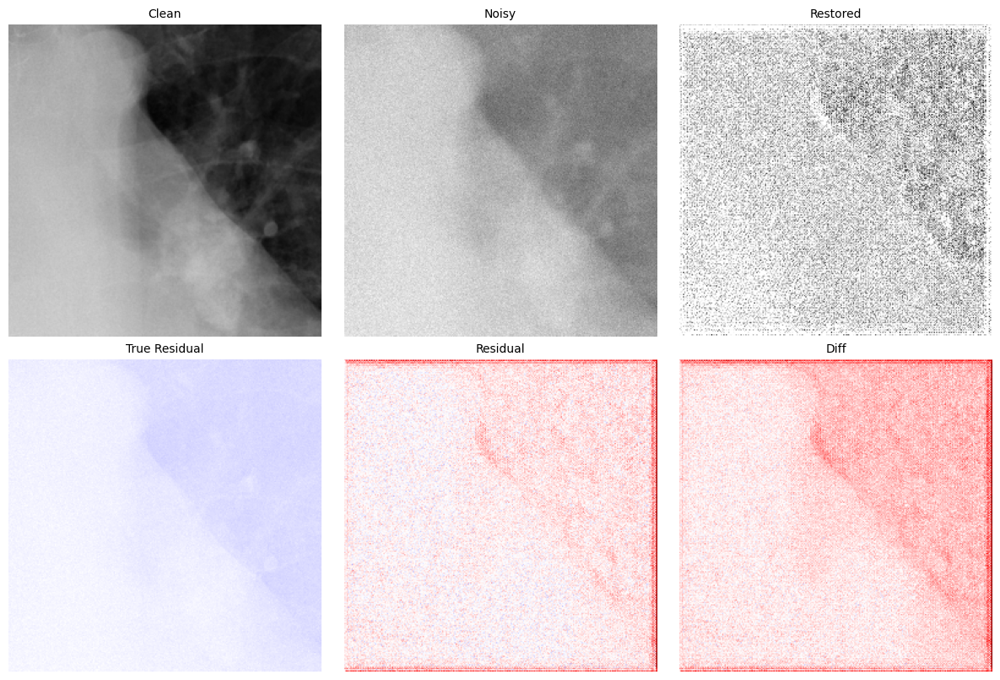

Val. Epoch 1/10


100%|██████████| 20/20 [00:23<00:00,  1.16s/it]


validation loss: 0.184717
validation MSE: 0.320735
validation SSIM: 0.003263
validation PSNR: 4.941001
validation L1: 0.499212
validation Gradien MSE: 0.048699
validation Gradien L1: 0.096331
validation Diagnostic Loss: 0.016234


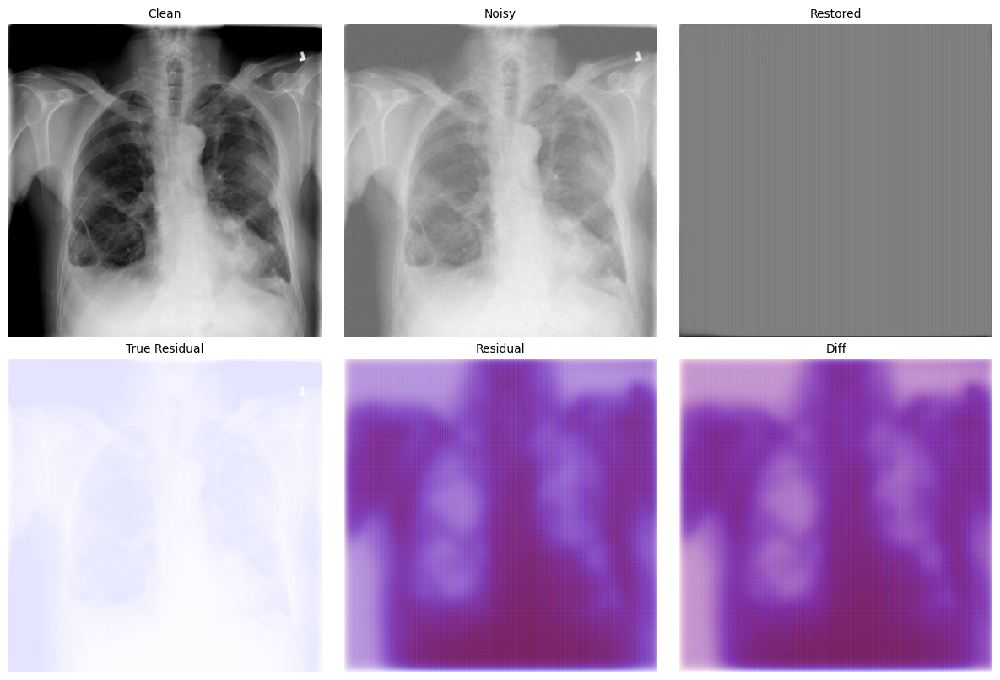

Train Epoch 2/10


100%|██████████| 1/1 [00:18<00:00, 18.03s/it]


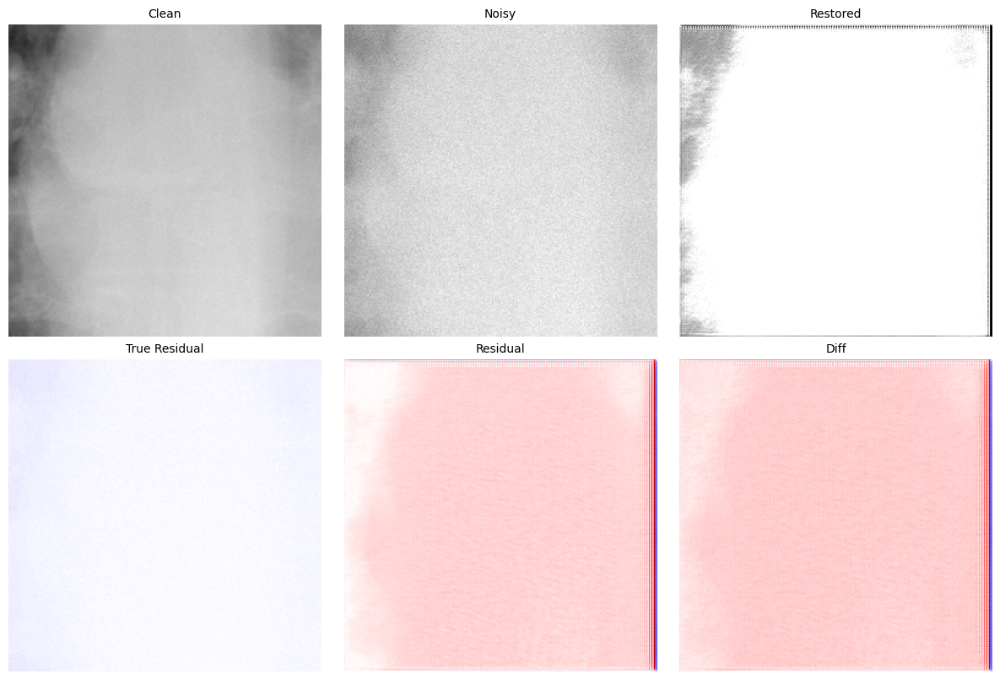

Val. Epoch 2/10


100%|██████████| 20/20 [00:22<00:00,  1.14s/it]


validation loss: 0.187182
validation MSE: 0.321782
validation SSIM: 0.003194
validation PSNR: 4.926868
validation L1: 0.500020
validation Gradien MSE: 0.052582
validation Gradien L1: 0.097087
validation Diagnostic Loss: 0.016449


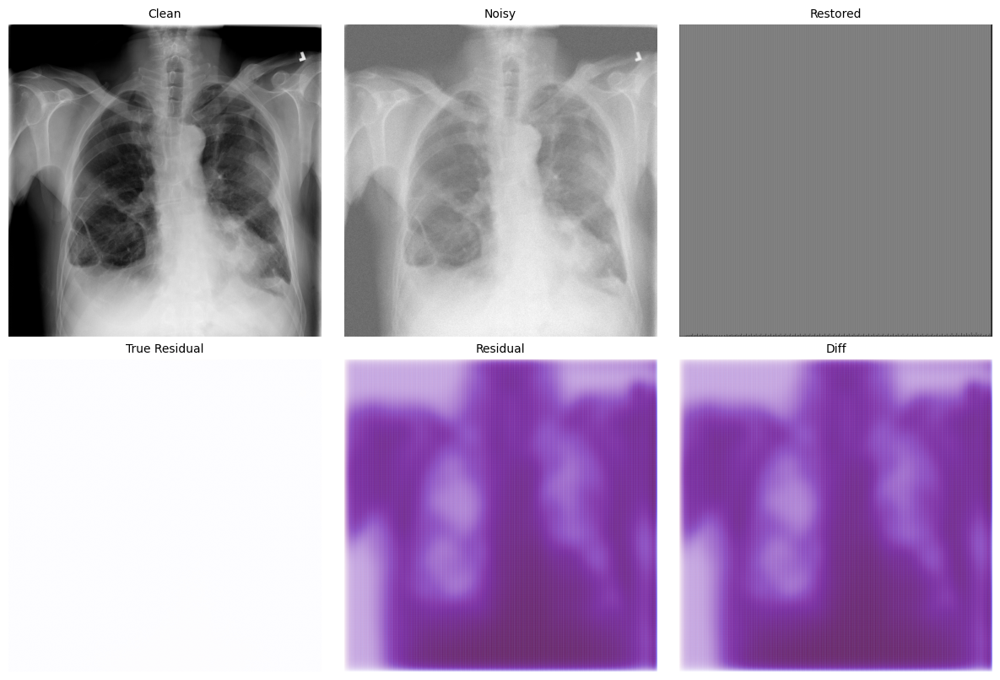

Train Epoch 3/10


100%|██████████| 1/1 [00:17<00:00, 17.21s/it]


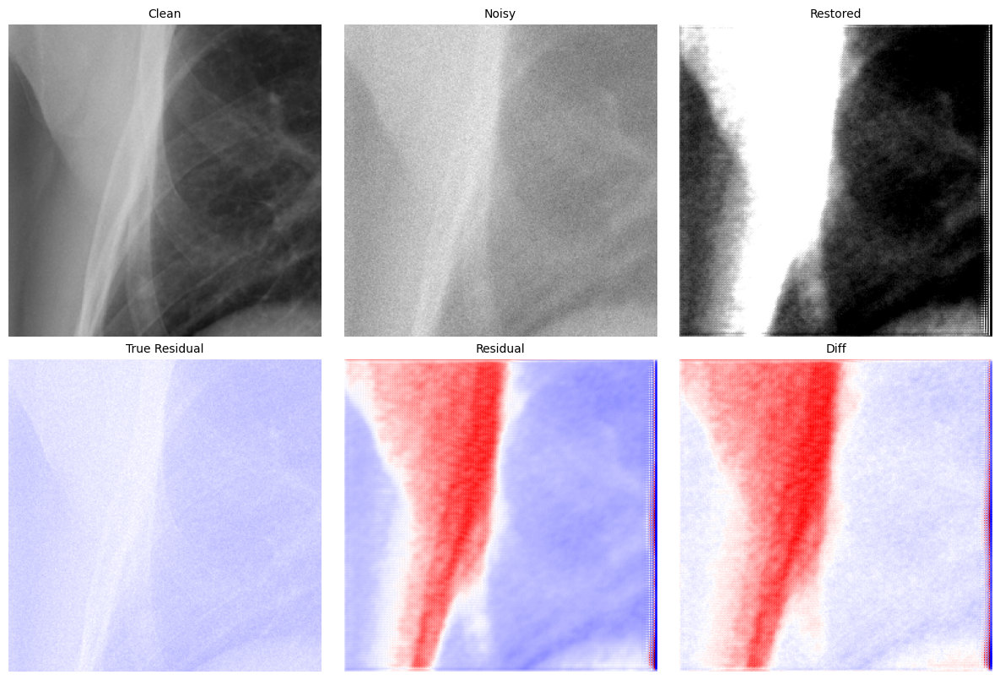

Val. Epoch 3/10


100%|██████████| 20/20 [00:22<00:00,  1.11s/it]


validation loss: 0.189672
validation MSE: 0.331958
validation SSIM: 0.003559
validation PSNR: 4.815266
validation L1: 0.510197
validation Gradien MSE: 0.047386
validation Gradien L1: 0.094464
validation Diagnostic Loss: 0.019244


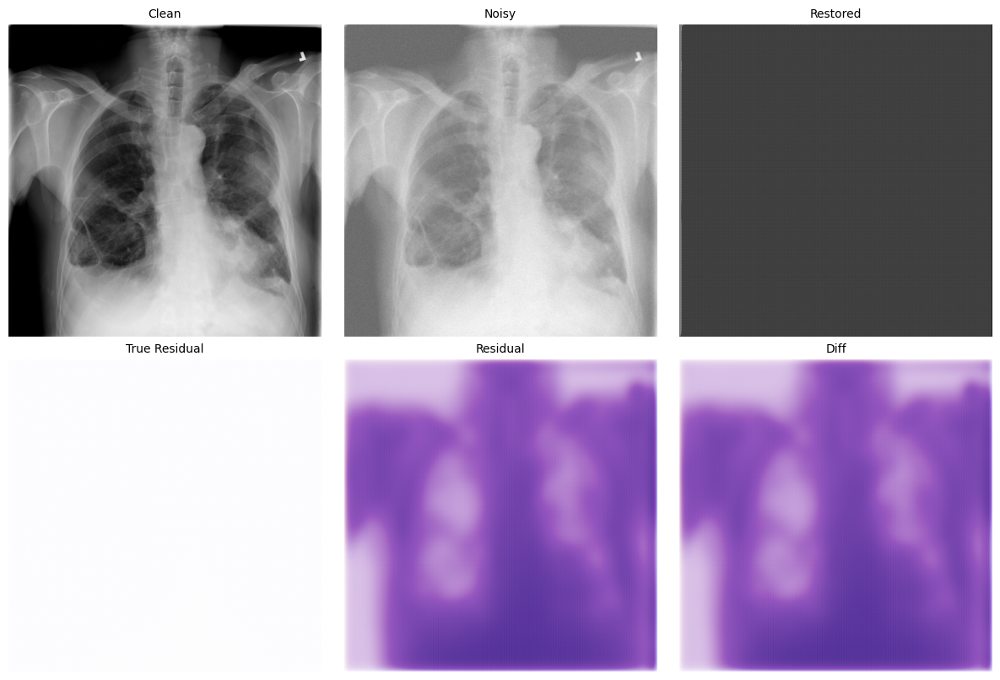


--- Training Step 2/3: patch_size=512, epochs=3, batch_size=8 ---
Train Epoch 4/10


100%|██████████| 4/4 [00:31<00:00,  7.87s/it]


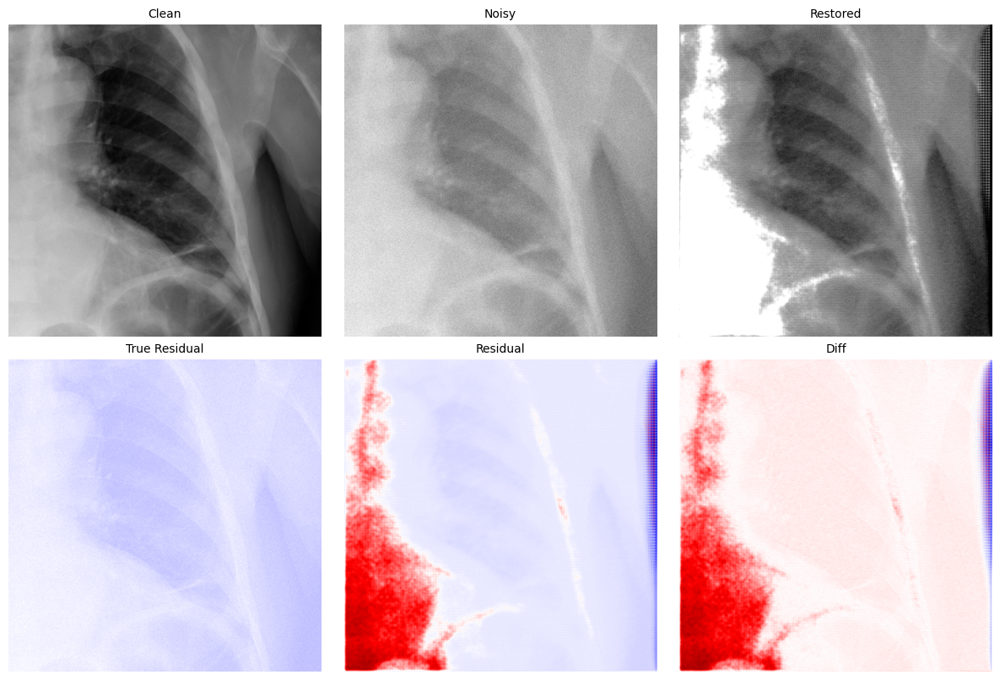

Val. Epoch 4/10


100%|██████████| 20/20 [00:22<00:00,  1.11s/it]


validation loss: 0.182547
validation MSE: 0.331306
validation SSIM: 0.003435
validation PSNR: 4.824369
validation L1: 0.509545
validation Gradien MSE: 0.033788
validation Gradien L1: 0.088074
validation Diagnostic Loss: 0.019139


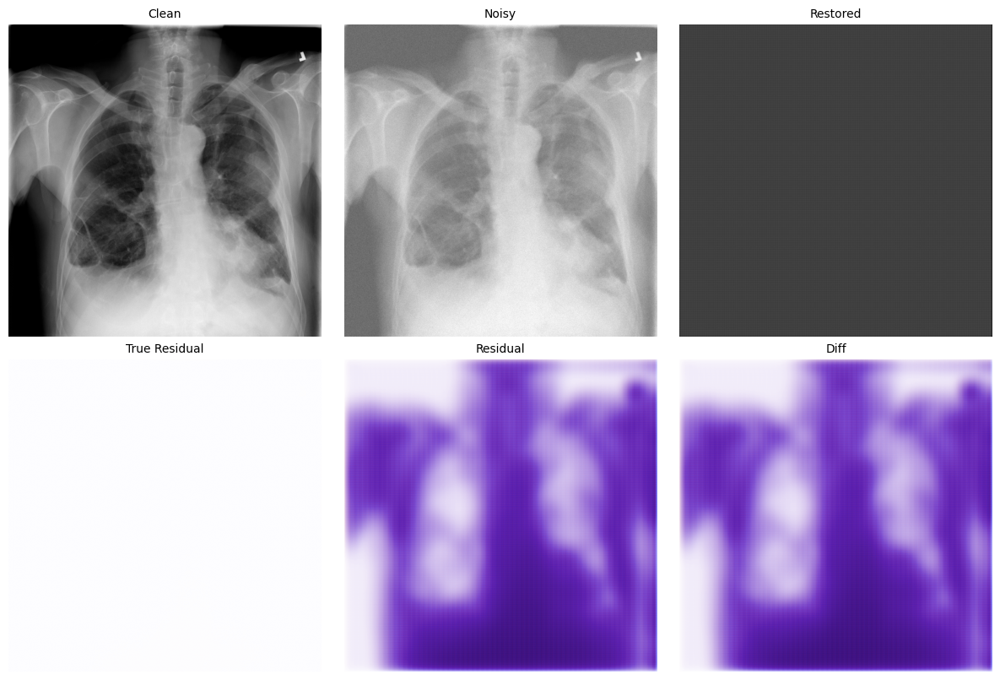

Train Epoch 5/10


100%|██████████| 4/4 [00:31<00:00,  7.78s/it]


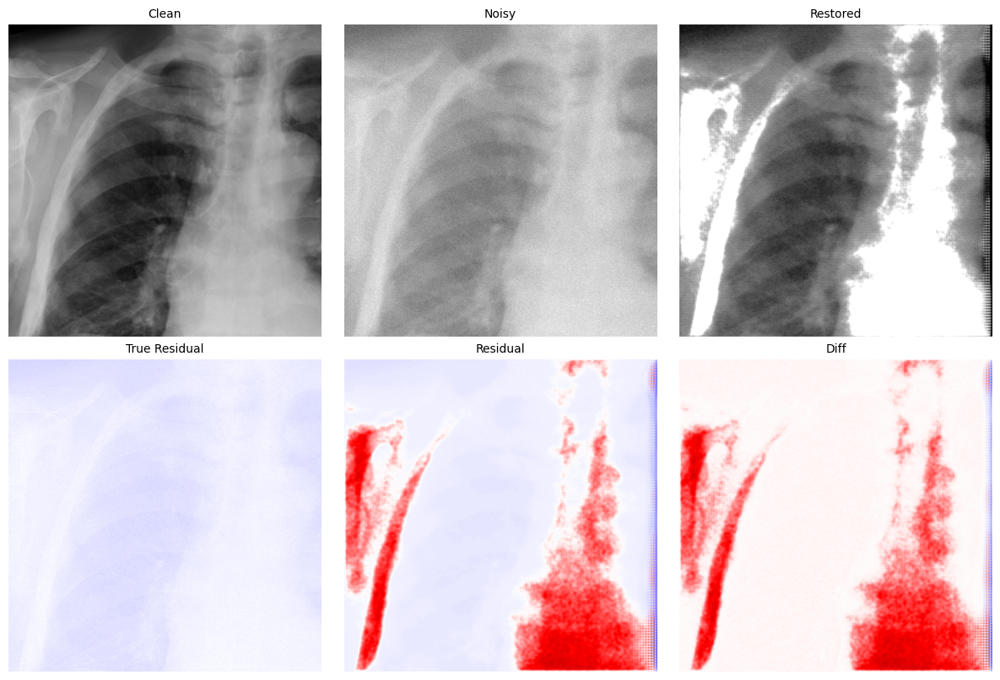

Val. Epoch 5/10


100%|██████████| 20/20 [00:22<00:00,  1.12s/it]


validation loss: 0.186587
validation MSE: 0.326675
validation SSIM: 0.005308
validation PSNR: 4.888922
validation L1: 0.511386
validation Gradien MSE: 0.046500
validation Gradien L1: 0.106759
validation Diagnostic Loss: 0.019107


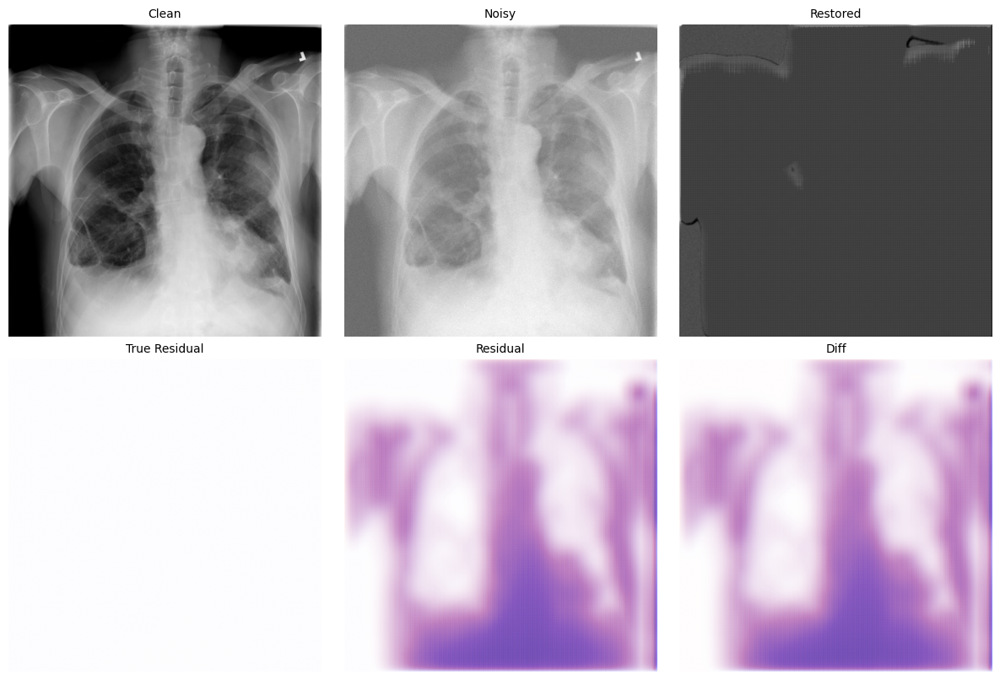

Train Epoch 6/10


100%|██████████| 4/4 [00:30<00:00,  7.69s/it]


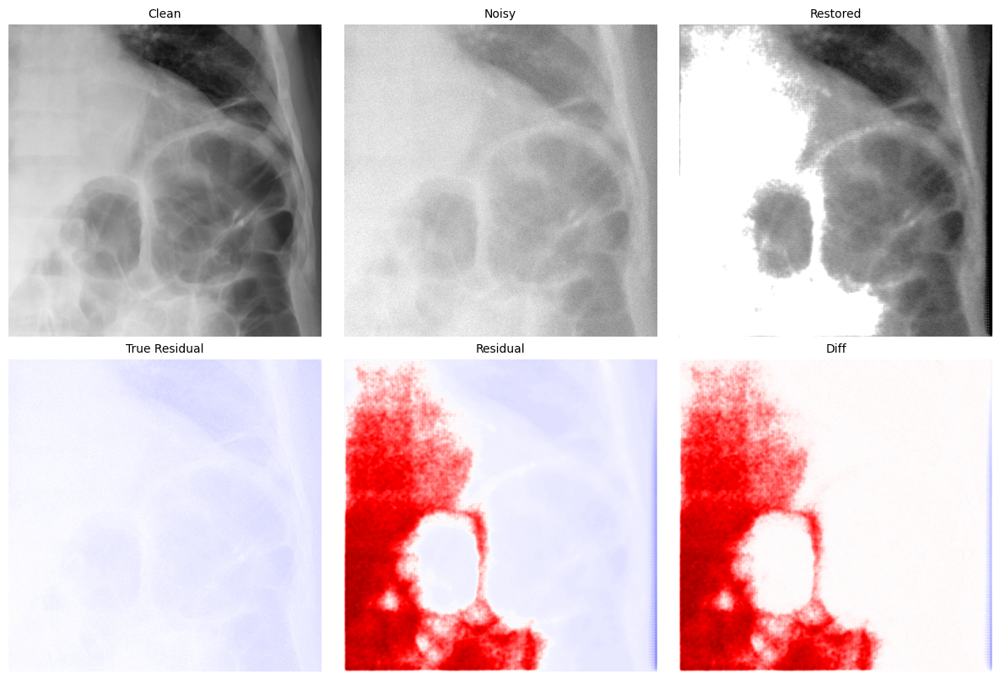

Val. Epoch 6/10


100%|██████████| 20/20 [00:22<00:00,  1.11s/it]


validation loss: 0.169189
validation MSE: 0.297997
validation SSIM: 0.041926
validation PSNR: 5.312324
validation L1: 0.484908
validation Gradien MSE: 0.040380
validation Gradien L1: 0.118825
validation Diagnostic Loss: 0.017914


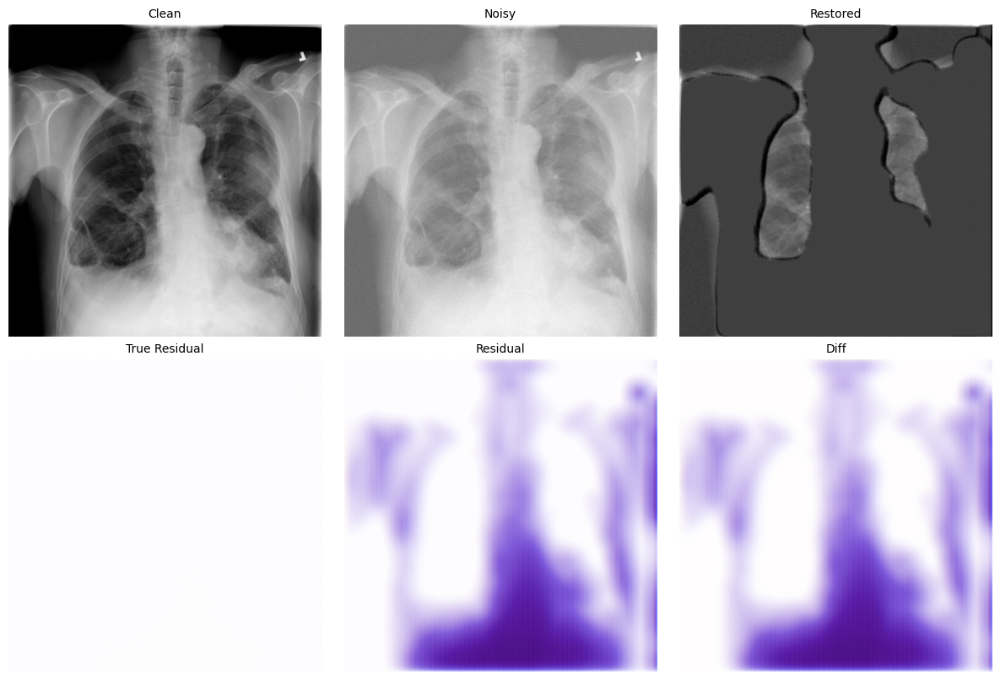


--- Training Step 3/3: patch_size=1024, epochs=4, batch_size=2 ---
Resetting optimizer learning rate
Train Epoch 7/10


100%|██████████| 16/16 [01:01<00:00,  3.83s/it]


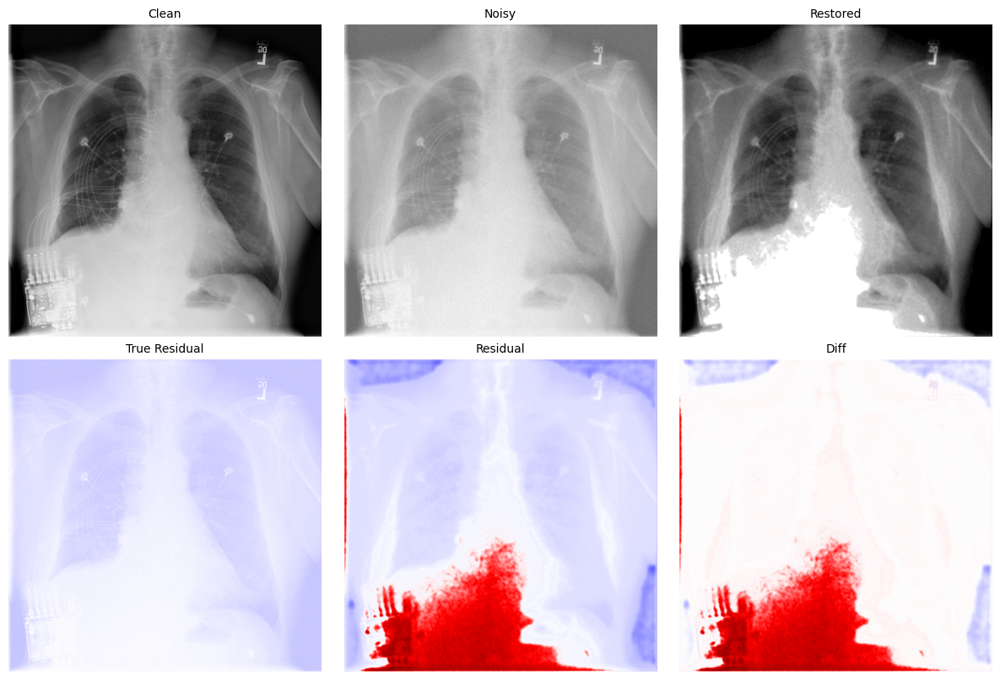

Val. Epoch 7/10


100%|██████████| 20/20 [00:25<00:00,  1.29s/it]


validation loss: 0.020780
validation MSE: 0.005347
validation SSIM: 0.512494
validation PSNR: 22.781031
validation L1: 0.052539
validation Gradien MSE: 0.037702
validation Gradien L1: 0.166147
validation Diagnostic Loss: 0.019292


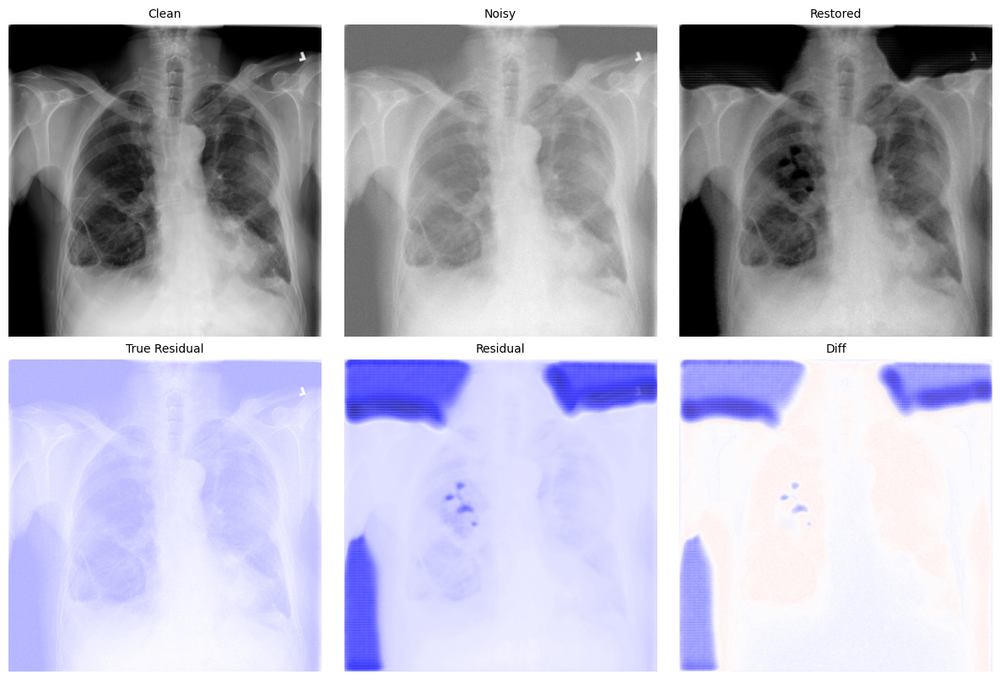

Train Epoch 8/10


100%|██████████| 16/16 [01:00<00:00,  3.79s/it]


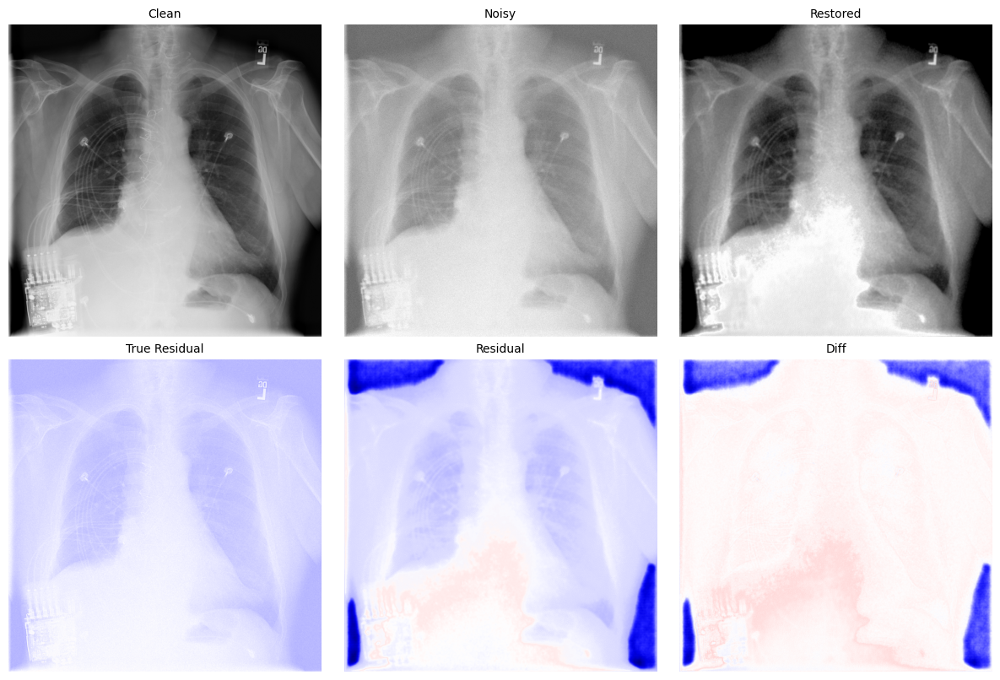

Val. Epoch 8/10


100%|██████████| 20/20 [00:25<00:00,  1.29s/it]


validation loss: 0.090976
validation MSE: 0.202965
validation SSIM: 0.226568
validation PSNR: 7.222915
validation L1: 0.299195
validation Gradien MSE: 0.052237
validation Gradien L1: 0.147400
validation Diagnostic Loss: 0.017726


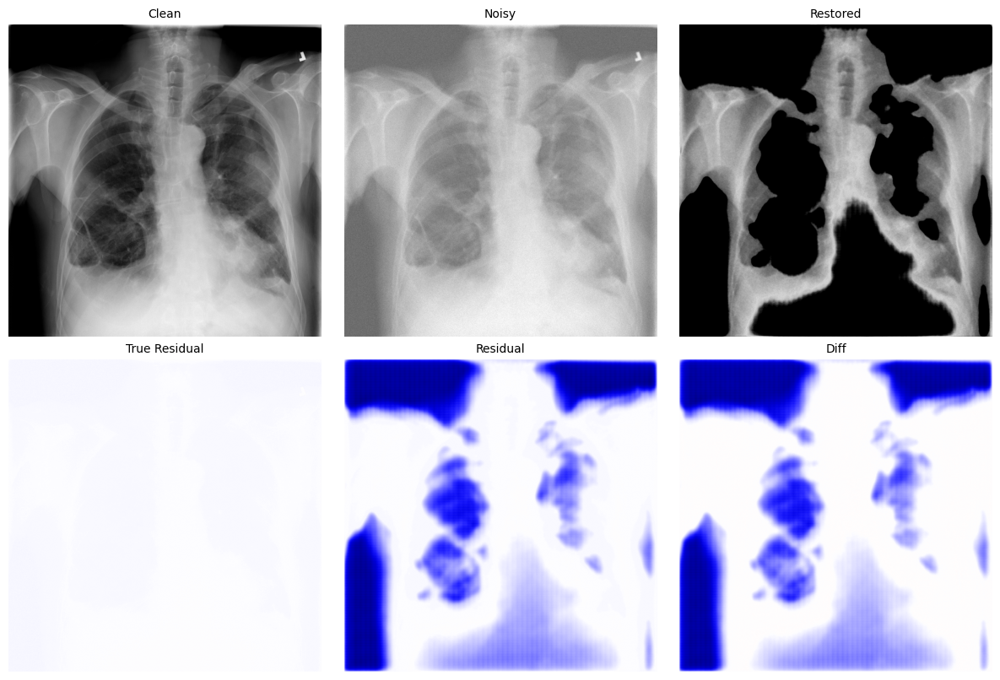

Train Epoch 9/10


100%|██████████| 16/16 [01:00<00:00,  3.80s/it]


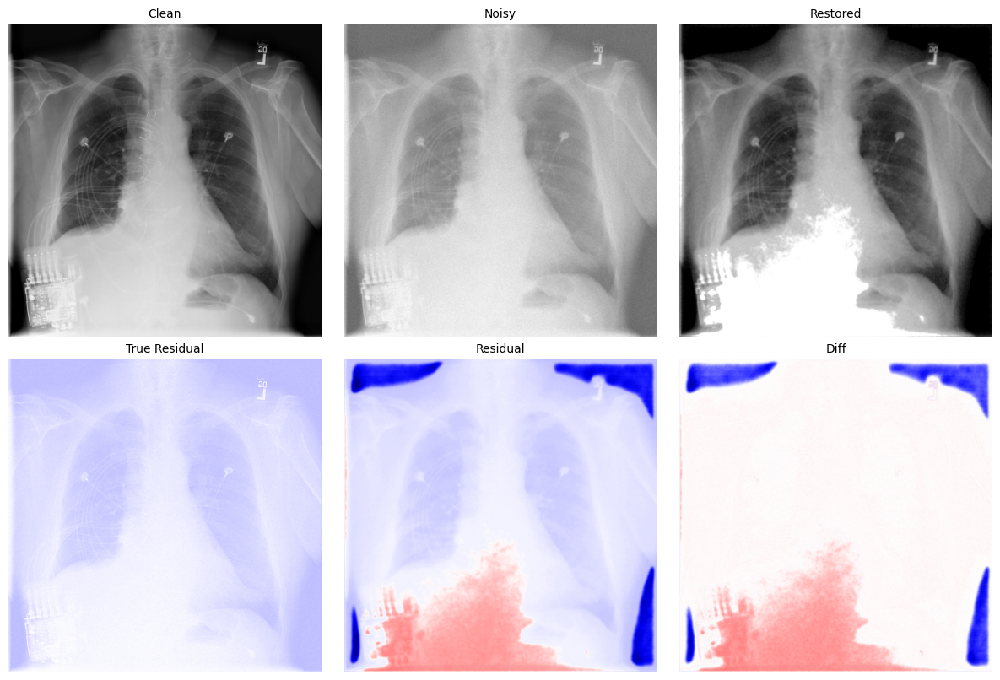

Val. Epoch 9/10


100%|██████████| 20/20 [00:25<00:00,  1.29s/it]


validation loss: 0.018459
validation MSE: 0.014371
validation SSIM: 0.534687
validation PSNR: 18.446109
validation L1: 0.089920
validation Gradien MSE: 0.026791
validation Gradien L1: 0.123411
validation Diagnostic Loss: 0.014216


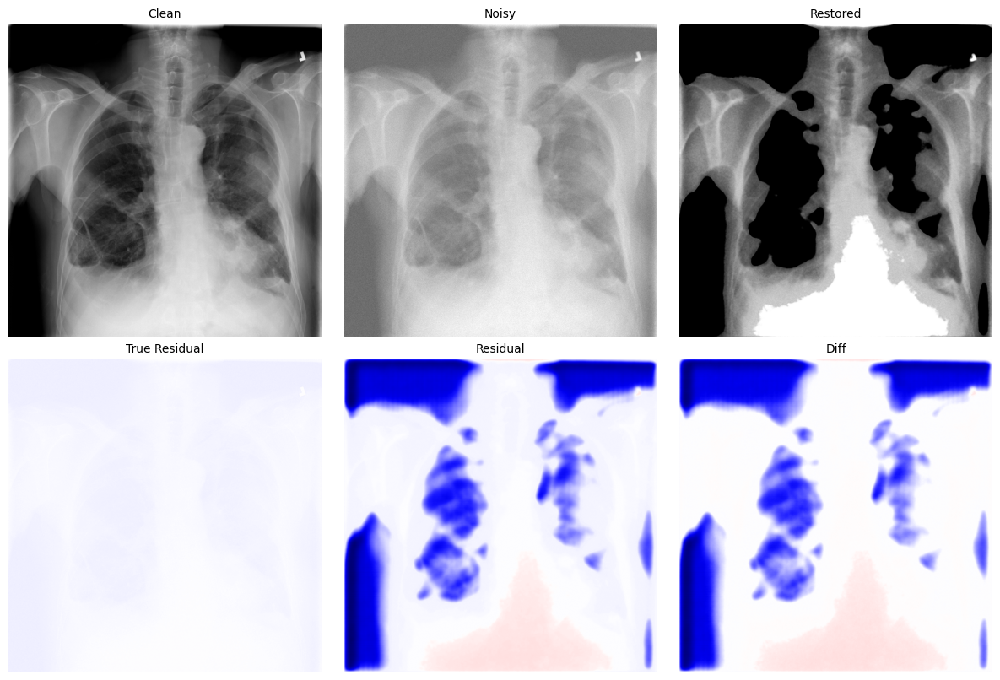

Train Epoch 10/10


100%|██████████| 16/16 [01:01<00:00,  3.84s/it]


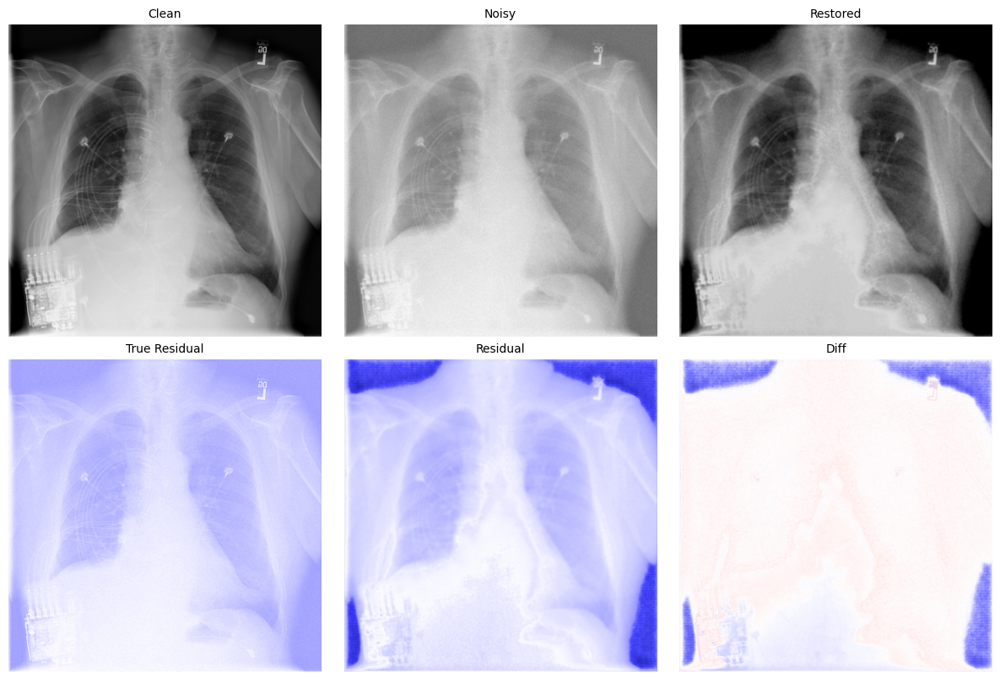

Val. Epoch 10/10


100%|██████████| 20/20 [00:26<00:00,  1.30s/it]


validation loss: 0.026239
validation MSE: 0.010277
validation SSIM: 0.460128
validation PSNR: 19.962963
validation L1: 0.062348
validation Gradien MSE: 0.024004
validation Gradien L1: 0.128521
validation Diagnostic Loss: 0.044435


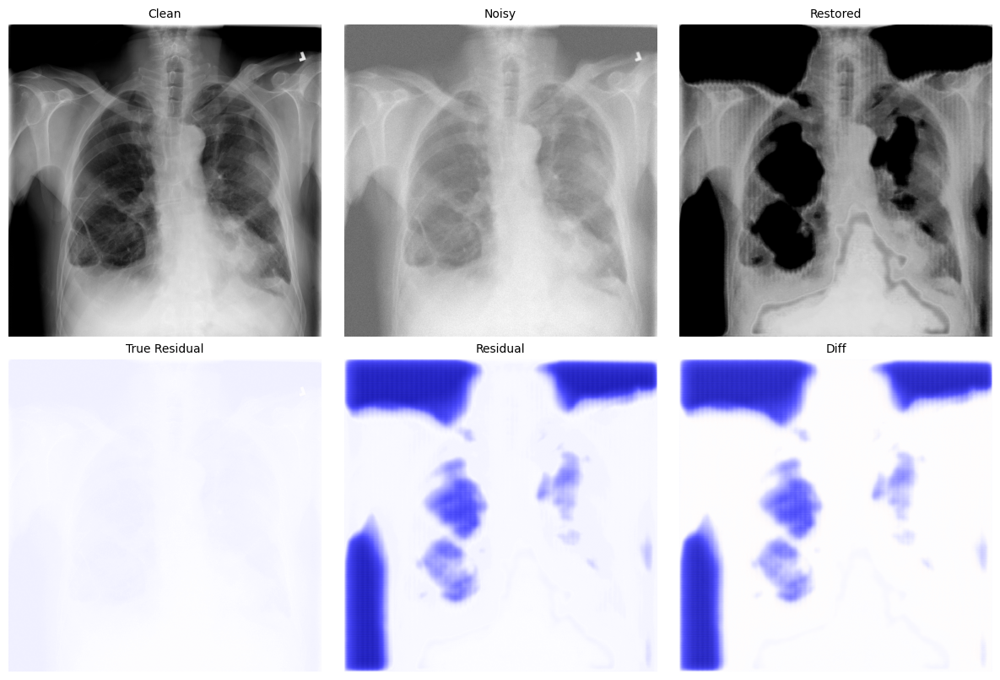

In [9]:
# ------ Training ------
torch.cuda.empty_cache()


optimizer = optim.Adam(model.parameters(), lr=0.01)
ssim = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

start_time = last_epoch_time = time.time()

# --- Logging ---
train_loss_hist = []
val_loss_hist = []
val_epoch_idxs = []


metrics_hist = []

# --- Training Loop with Patch Stages ---
global_epoch = 0
for step_idx, (step, train_dl) in enumerate(zip(TRAINING_STEPS, training_step_dataloaders)):
    print(f"\n--- Training Step {step_idx + 1}/{len(TRAINING_STEPS)}: "
          f"patch_size={step['patch_size']}, epochs={step['epochs']}, batch_size={step['batch_size']} ---")
    
    # Reset optimizer if specified
    if step["reset_lr"]:
        print("Resetting optimizer learning rate")
        optimizer = optim.Adam(model.parameters(), lr=0.01)
    
    loss_function = step["loss_fn"].to(device)
    log_metrics["loss"] = loss_function

    for local_epoch in range(step["epochs"]):
        print(f"Train Epoch {global_epoch + 1}/{num_epochs}")
        model.train()
        train_loss = 0.0
        train_ssim = 0.0



        # --- Validation ---
        for i, (clean, _lbls) in enumerate(tqdm(train_dl)):
            optimizer.zero_grad()

            clean = clean.to(device)
            noisy = NOISE_MOD(clean).to(device)

            res = model(noisy)
            out = (noisy + res).clamp(0.0,1.0)
            
            loss = loss_function(out, clean)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * noisy.size(0)

        train_loss /= len(train_dl.dataset)
        train_loss_hist.append(train_loss)
 

        plot_cxr_res(clean[0], noisy[0], out[0], res[0])
        # --- Validation ---
        print(f"Val. Epoch {global_epoch + 1}/{num_epochs}")
        model.eval()
        val_loss = 0.0

        val_metrics = {}
        for metric_name, metric in log_metrics.items():
            val_metrics[metric_name] = 0.0

        with torch.no_grad():
            for i, (clean, _lbls) in enumerate(tqdm(val_dl)):
               
                clean = clean.to(device)
                noisy = NOISE_MOD(clean).to(device)

                res = model(noisy)
                out = (noisy + res).clamp(0.0,1.0)
            
                loss = loss_function(out, clean)
                val_loss += loss.item() * noisy.size(0)
                
                for metric_name, metric in log_metrics.items():
                    metric_value = metric(out, clean).item()
                    val_metrics[metric_name] += metric_value * noisy.size(0)
                
            for metric_name, metric_value in log_metrics.items():
                val_metrics[metric_name] /= len(val_dl.dataset)
                print(f"validation {metric_name}: {val_metrics[metric_name]:.6f}")
                
            metrics_hist.append(copy.deepcopy(val_metrics))
            
            val_loss /= len(val_dl.dataset)
            val_loss_hist.append(val_loss)
            val_epoch_idxs.append(global_epoch)

            plot_cxr_res(clean[0], noisy[0], out[0], res[0])

            torch.save({
                'epoch': global_epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'loss': train_loss
            }, f"models/checkpoints/checkpoint_epoch_{global_epoch}.pth")

        global_epoch += 1

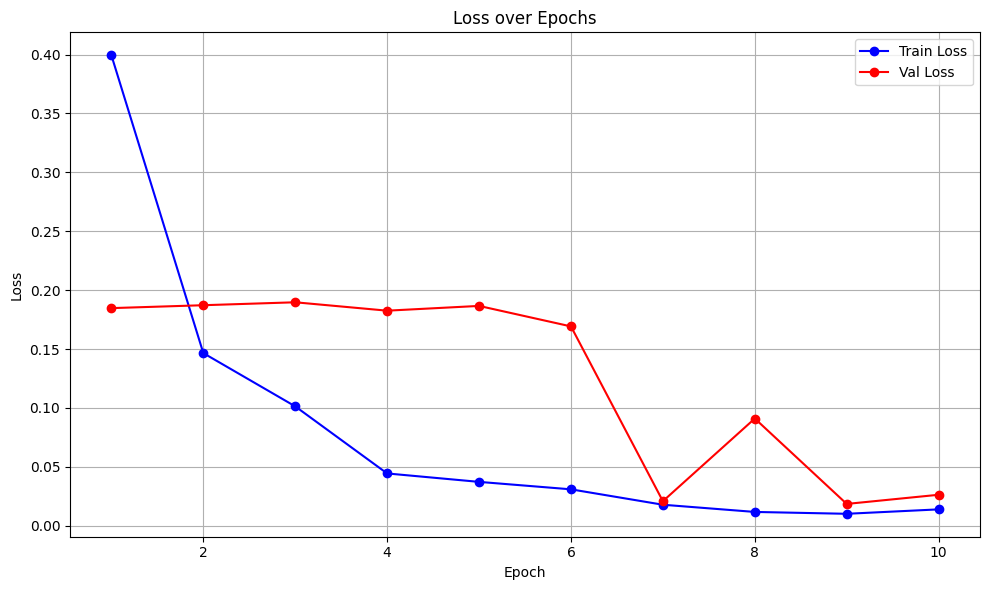

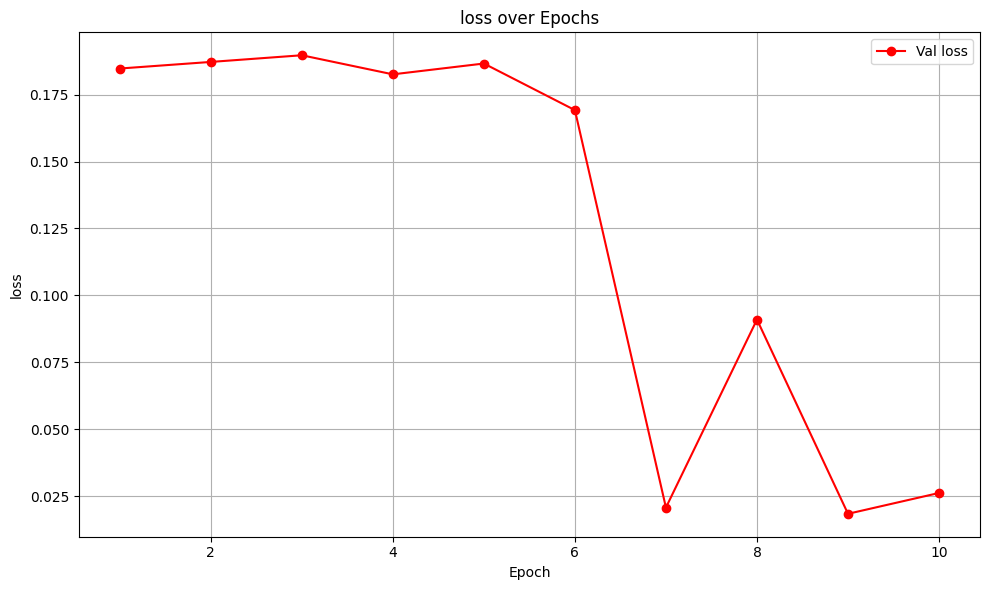

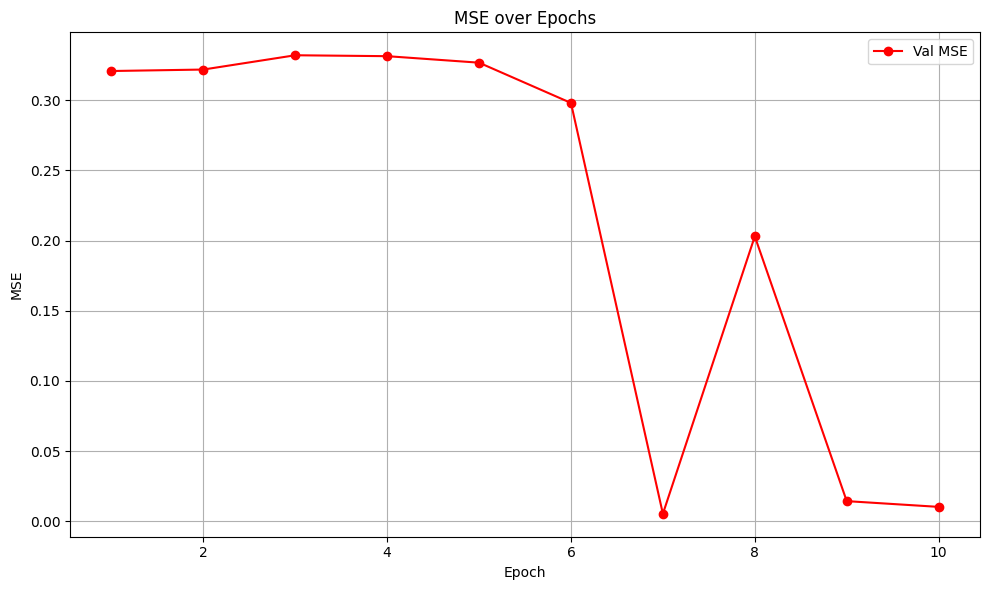

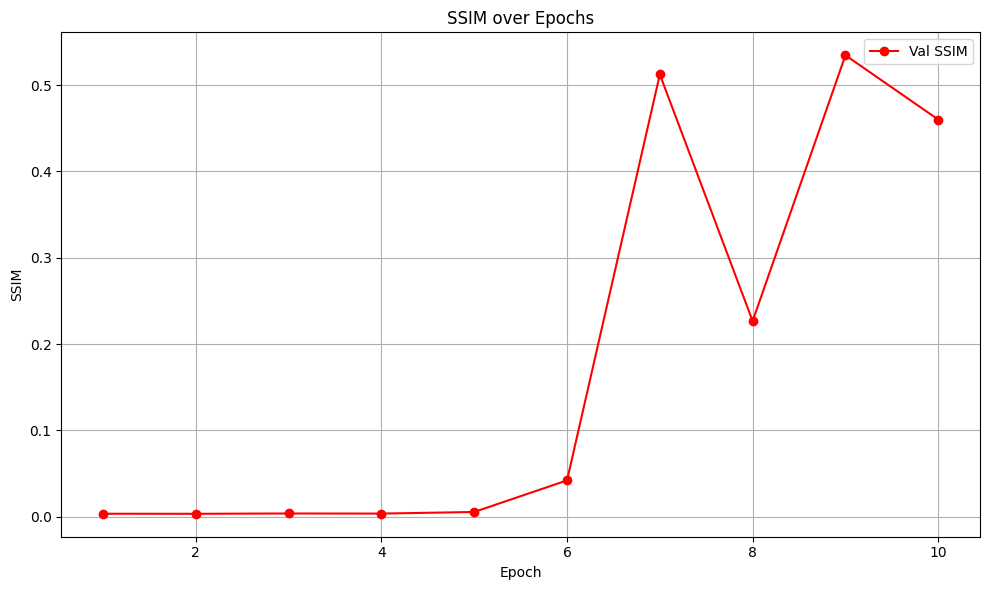

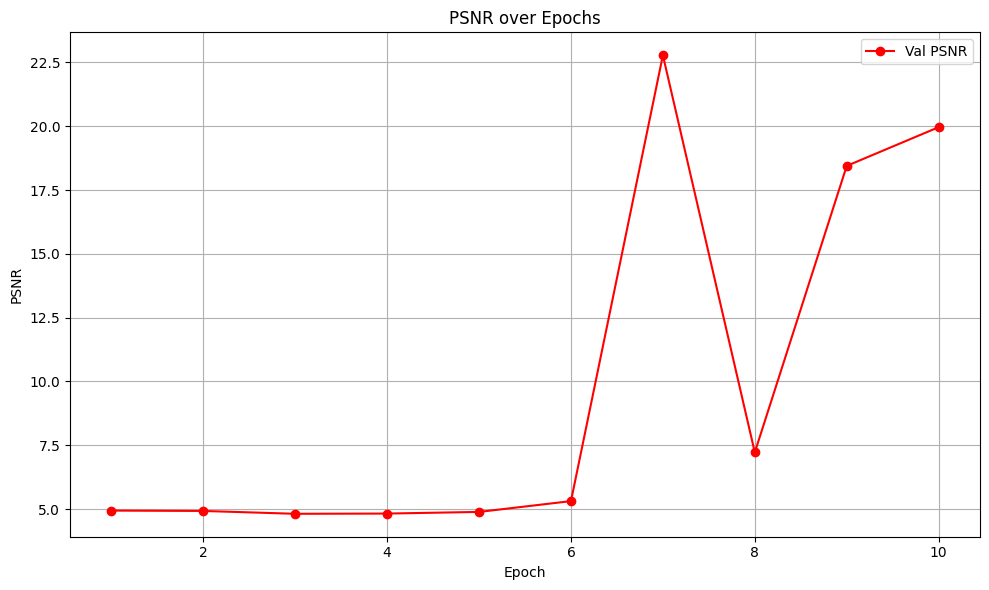

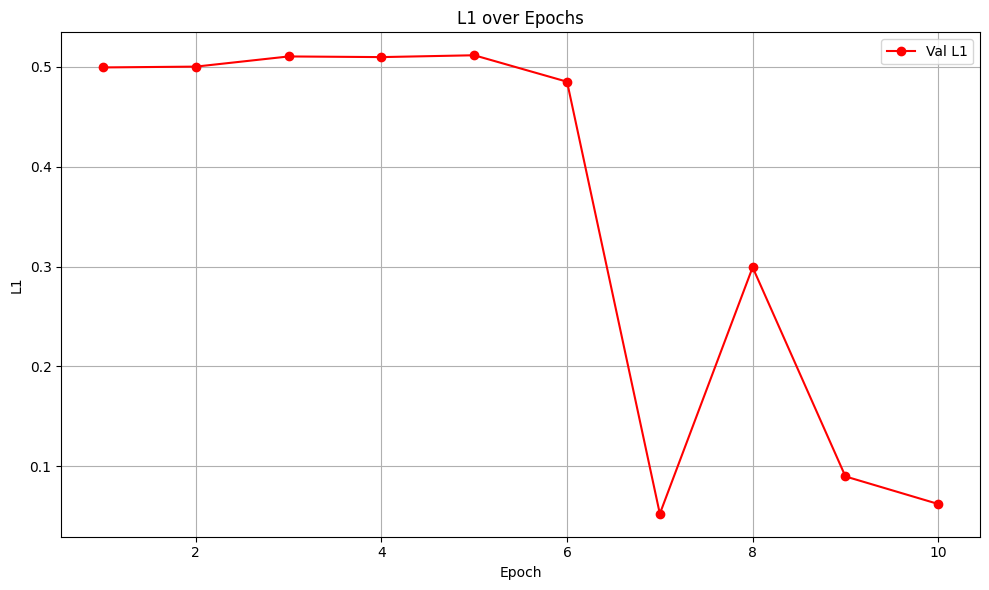

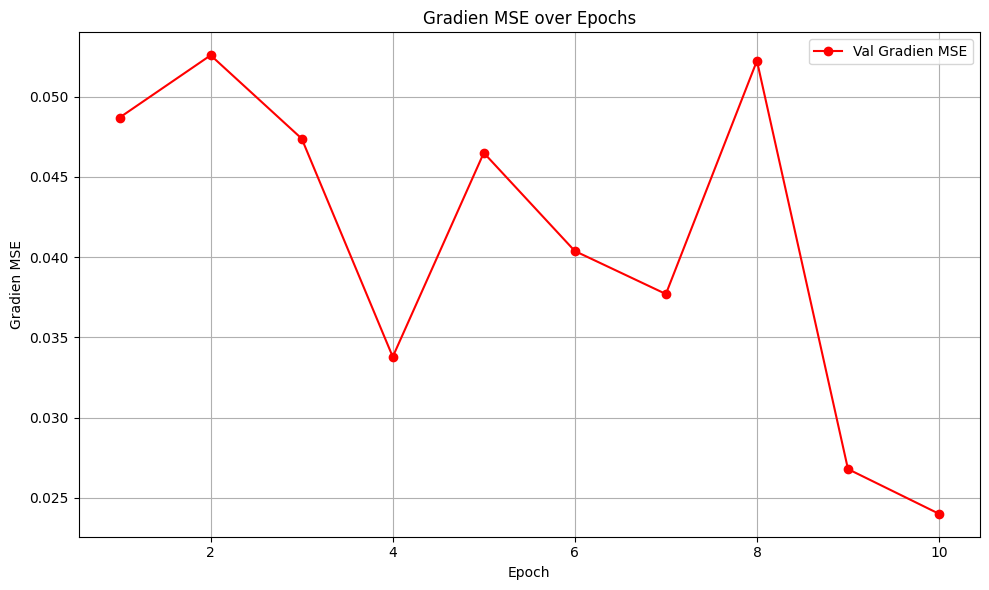

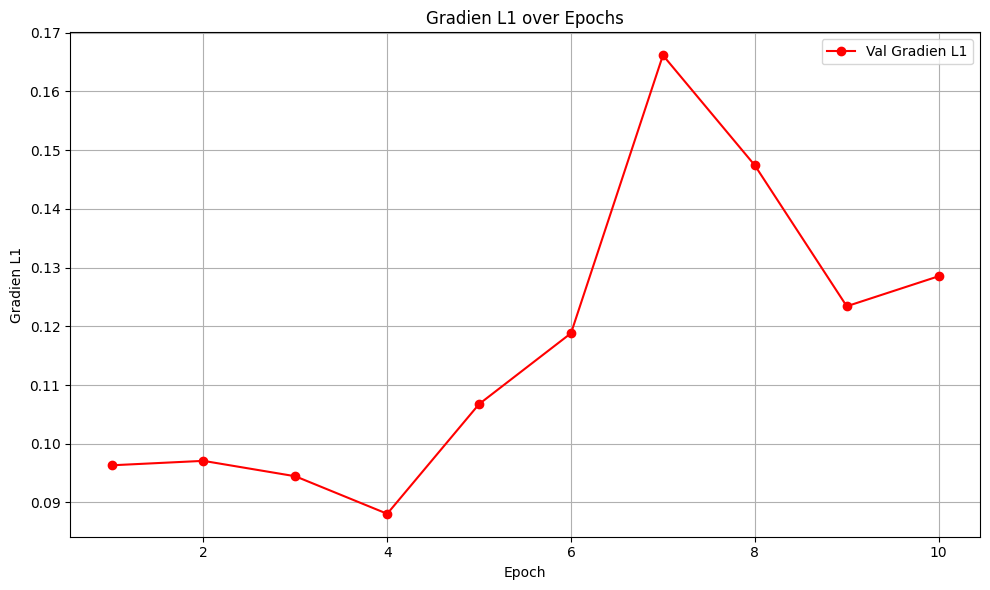

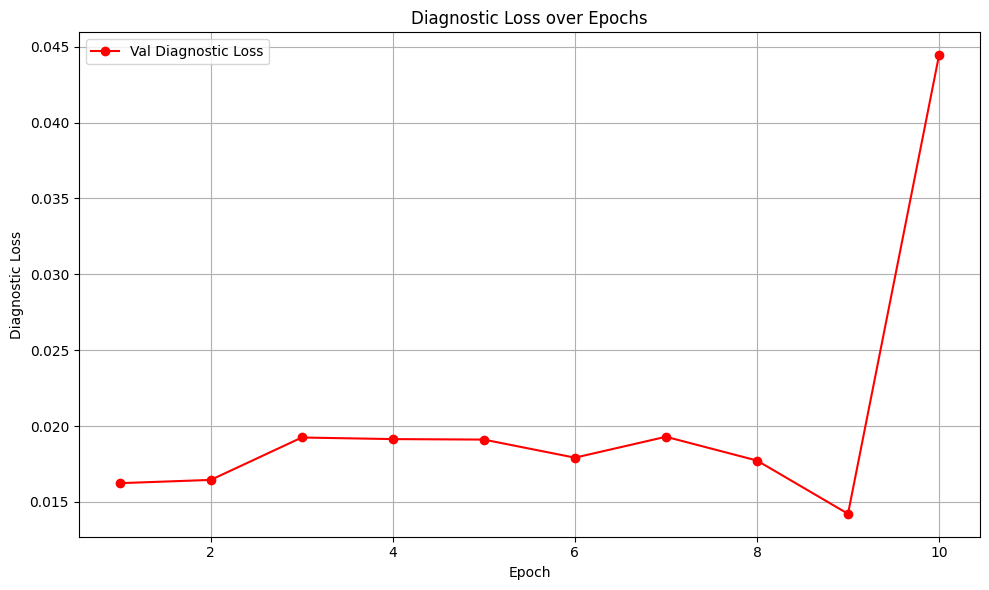

In [12]:
# ------ Training Breakdown ------
epochs = list(range(1, num_epochs + 1))
val_epochs = [i + 1 for i in val_epoch_idxs]

plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss_hist, "b-o", label="Train Loss")
plt.plot(val_epochs, val_loss_hist, "r-o", label="Val Loss")
plt.title("Loss over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


for metric_name in log_metrics.keys():
    train_metric_hist = [metrics[metric_name] for metrics in metrics_hist]
    val_metric_hist = [metrics[metric_name] for metrics in metrics_hist]

    plt.figure(figsize=(10, 6))
    plt.plot(val_epochs, val_metric_hist, "r-o", label="Val " + metric_name)
    plt.title(f"{metric_name} over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel(metric_name)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [13]:
# ------ Final Test Evaluation ------
model.eval()
test_loss = 0.0
test_ssim_score = 0.0

# --- Final Test Performance ---

random_three_letters = "".join(np.random.choice(list("abcdefghijklmnopqrstuvwxyz"), 3))
torch.save(model.state_dict(), f"models/{model.name()}_{random_three_letters}.pth")

import json
from datetime import datetime

model_metadata = {
    "model_name": model.name(),
    "model_name_random_suffix": random_three_letters,
    "model_file_name": f"{model.name()}_{random_three_letters}.pth",
    "timestamp": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
    "architecture": "UNet",
    "s": model.s,
    "k": model.k,
    "num_parameters": sum(p.numel() for p in model.parameters()),
    "num_epochs": num_epochs,
    "num_train_images": len(train_dl.dataset),
    "val_loss": val_loss_hist[-1] if val_loss_hist else None,
    "test_loss": test_loss,
}

with torch.no_grad():
    val_metrics = {}
    for metric_name in log_metrics.keys():
        val_metrics[metric_name] = 0.0

    for i, (clean, _lbls) in enumerate(tqdm(test_dl)):
        clean = clean.to(device)
        noisy = NOISE_MOD(clean).to(device)
        res = model(noisy)
        out = (noisy + res).clamp(0.0,1.0)
    
        loss = loss_function(out, clean)
        val_loss += loss.item() * noisy.size(0)
        
        for metric_name, metric in log_metrics.items():
            metric_value = metric(out, clean).item()
            val_metrics[metric_name] += metric_value * noisy.size(0)
        
    for metric_name in log_metrics.keys():
        val_metrics[metric_name] /= len(test_dl.dataset)
        print(f"testing {metric_name}: {val_metrics[metric_name]:.6f}")
        model_metadata[f"metric_testing_{metric_name}"] = val_metrics[metric_name]


with open(f"models/{model.name()}_{random_three_letters}_meta.json", "w") as f:
    json.dump(model_metadata, f, indent=4)

torch.save({
    "model_state": model.state_dict(),
    "metadata": model_metadata
}, f"models/{model.name()}_{random_three_letters}_bundle.pth")

print(f"!saved model: '{model.name()}_{random_three_letters}'!")

100%|██████████| 20/20 [00:26<00:00,  1.32s/it]

testing loss: 0.026721
testing MSE: 0.010430
testing SSIM: 0.446141
testing PSNR: 19.966382
testing L1: 0.061527
testing Gradien MSE: 0.026494
testing Gradien L1: 0.133383
testing Diagnostic Loss: 0.043240
!saved model: 'res-unet-s4k32_xwc'!
